In [1]:
import numpy as np # linear algebra
import pandas as pd
from tqdm import tqdm
from glob import glob
from keras.layers import *
from keras.models import *
from keras.utils import *
import numpy as np
import os

Using TensorFlow backend.


# **Loading Training Files**

I have converted all images to numpy array to boost speed

In [2]:
normal = np.load('../input/pneumonia-chest-xray-npy/Array128/Array128/train_Normal_128.npy')
viral = np.load('../input/pneumonia-chest-xray-npy/Array128/Array128/train_Virus_128.npy')
bacterial = np.load('../input/pneumonia-chest-xray-npy/Array128/Array128/train_bacteria_128.npy')

In [3]:
normal.shape, viral.shape, bacterial.shape

((1341, 128, 128, 1), (1345, 128, 128, 1), (2530, 128, 128, 1))

In [4]:
label_normal = np.zeros(len(normal))
label_bacterial = np.ones(len(bacterial))
label_viral = np.full(len(viral),2, dtype = int)

In [5]:
train_data = np.concatenate((normal,bacterial,viral),axis=0)
train_label = np.concatenate((label_normal,label_bacterial,label_viral),axis=0)

In [6]:
train_label.shape, train_data.shape

((5216,), (5216, 128, 128, 1))

## Visualization

In [7]:
import matplotlib.pyplot as plt

### Normal

100%|██████████| 3/3 [00:00<00:00, 201.60it/s]


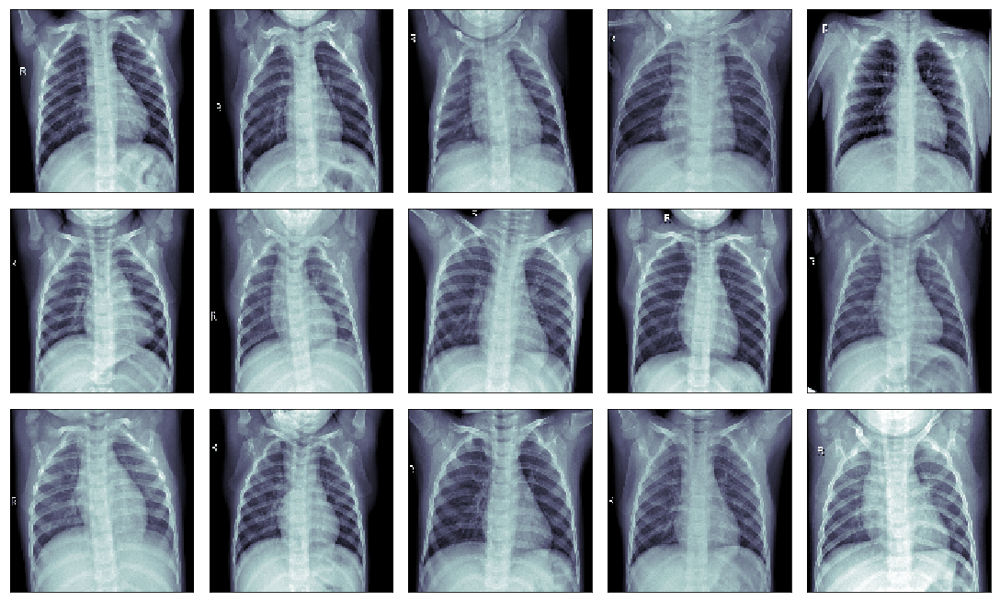

In [8]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(normal[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

# Viral

100%|██████████| 3/3 [00:00<00:00, 260.86it/s]


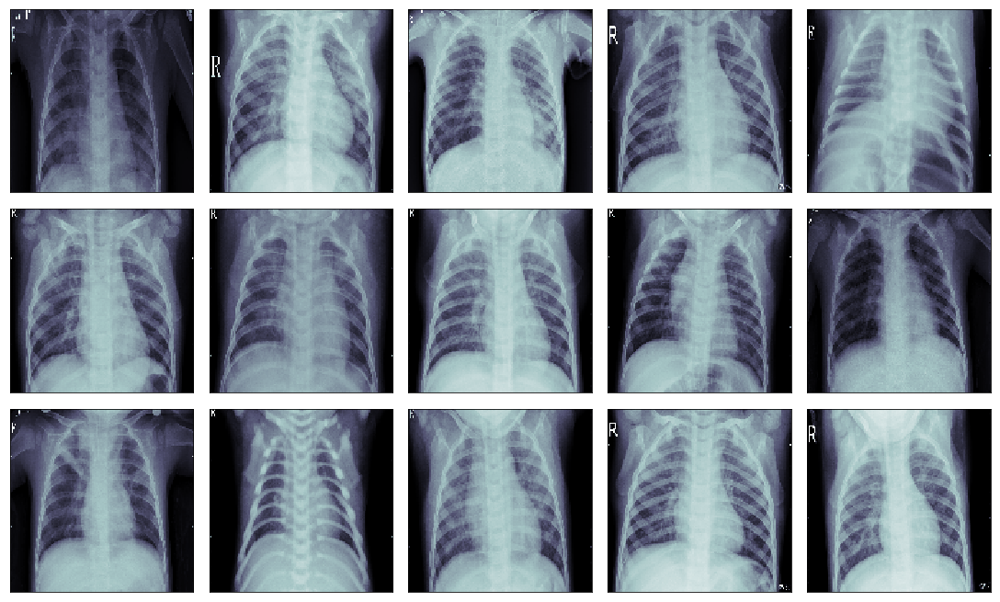

In [9]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(viral[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

## Bacterial

100%|██████████| 3/3 [00:00<00:00, 267.20it/s]


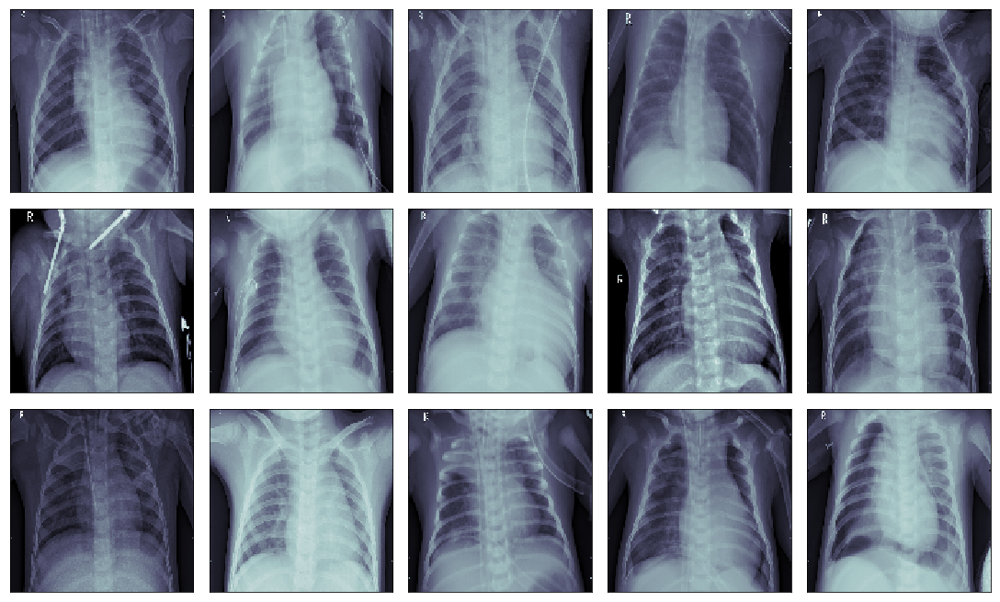

In [10]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(bacterial[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

# Loading Test Data

In [11]:
test_normal = np.load('../input/pneumonia-chest-xray-npy/Array128/Array128/test_Normal_128.npy')
test_viral = np.load('../input/pneumonia-chest-xray-npy/Array128/Array128/test_Virus_128.npy')
test_bacterial = np.load('../input/pneumonia-chest-xray-npy/Array128/Array128/test_bacteria_128.npy')

In [12]:
test_normal.shape, test_viral.shape , test_bacterial.shape

((234, 128, 128, 1), (148, 128, 128, 1), (242, 128, 128, 1))

In [13]:
label_test_normal = np.zeros(len(test_normal))
label_test_bacterial = np.ones(len(test_bacterial))
label_test_viral = np.full(len(test_viral),2, dtype = int)

In [14]:
test_data = np.concatenate((test_normal, test_bacterial, test_viral),axis=0)
test_label = np.concatenate((label_test_normal,label_test_bacterial,label_test_viral),axis=0)

In [15]:
test_data.shape

(624, 128, 128, 1)

## Visualization

## Normal

100%|██████████| 3/3 [00:00<00:00, 205.66it/s]
/opt/conda/lib/python3.6/site-packages/matplotlib/image.py:369: UserWarning: Casting input data from 'float128' to 'float64'for imshow
  "for imshow".format(A.dtype))


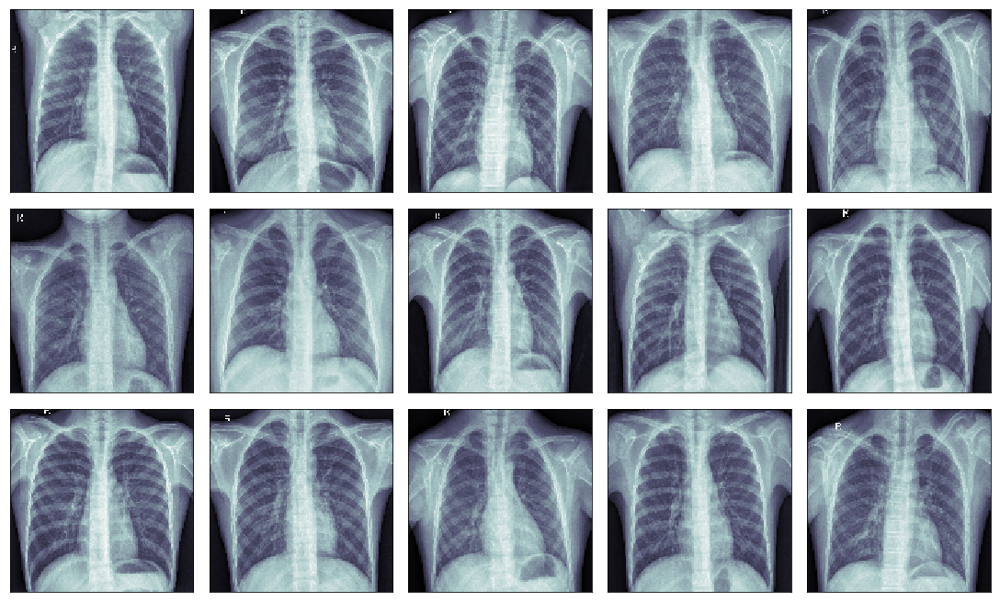

In [16]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(test_normal[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

## Viral

100%|██████████| 3/3 [00:00<00:00, 250.27it/s]


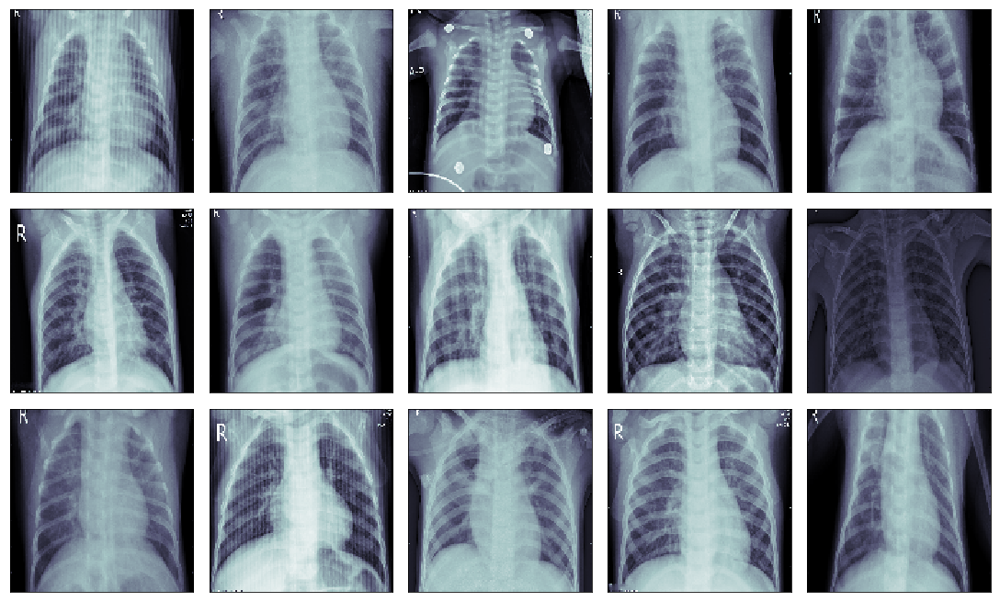

In [17]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(test_viral[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

## Bacterial

100%|██████████| 3/3 [00:00<00:00, 265.64it/s]


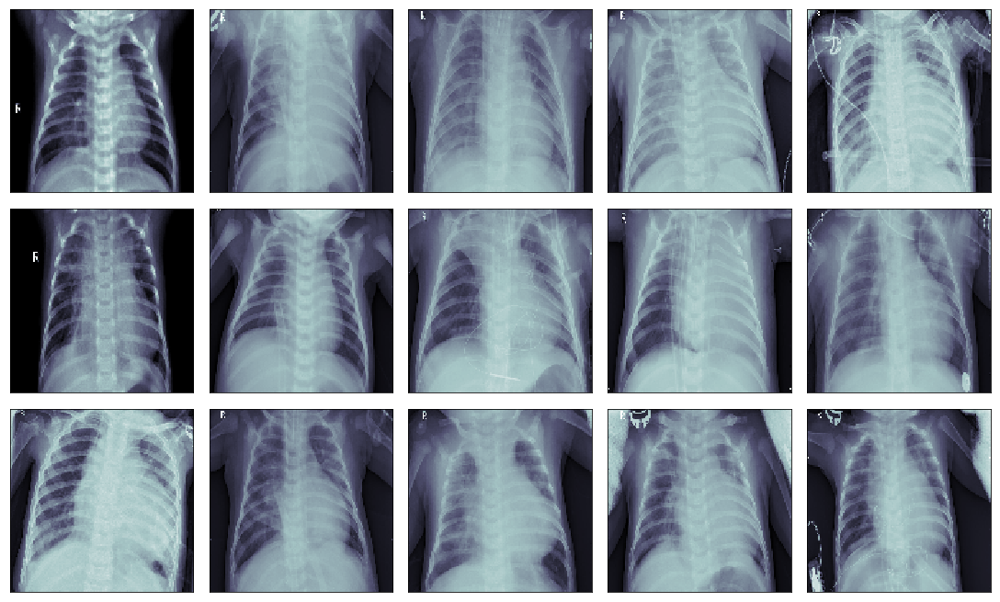

In [18]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(test_bacterial[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

# Dealing with Class Imbalance

In [19]:
from sklearn.utils import class_weight
 
 
class_weights = class_weight.compute_class_weight('balanced',
                                                 np.unique(train_label),
                                                 train_label)
class_weights

array([1.29654487, 0.68722003, 1.29268897])

# [CovXNet: A multi-dilation convolutional neural network for automatic COVID-19 and other pneumonia detection from chest X-ray images with transferable multi-receptive feature optimization](https://www.sciencedirect.com/science/article/pii/S0010482520302250)

#### Code:[here](https://github.com/Perceptron21/CovXNet)
## Residual & Shifter Unit:
![Residual & Shifter Unit](https://ars.els-cdn.com/content/image/1-s2.0-S0010482520302250-gr2.jpg)

## Model:
![Model](https://ars.els-cdn.com/content/image/1-s2.0-S0010482520302250-gr4.jpg)


## Residual Unit

In [20]:
def Residual_Unit(input_tensor, nb_of_input_channels, max_dilation, number_of_units):
    
  for i in range(number_of_units):
    x1 = Conv2D(nb_of_input_channels*2, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(input_tensor)
    x1 = BatchNormalization()(x1)
  
    a = []

    for i in range(1, max_dilation+1):
      temp = DepthwiseConv2D( kernel_size=(3,3), dilation_rate = (i,i), padding = 'same', activation= 'relu')(x1)
      temp = BatchNormalization()(temp)
      a.append(temp)

    x = Concatenate(axis= -1)(a)
    x = Conv2D(nb_of_input_channels, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(x)
    x = BatchNormalization()(x)

    x = Add()([x, input_tensor])

    input_tensor = x
  
  return x


## Shifter Unit

In [21]:
# Shifter Unit:

def Shifter_Unit(input_tensor, nb_of_input_channels, max_dilation):
    x1 = Conv2D(nb_of_input_channels*4, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(input_tensor)
    x1 = BatchNormalization()(x1)

    a = []

    for i in range(1, max_dilation+1):
      temp = DepthwiseConv2D( kernel_size=(3,3), dilation_rate = (i,i), padding = 'same', activation= 'relu')(x1)
      temp = MaxPool2D(pool_size=(2,2))(temp)
      temp = BatchNormalization()(temp)
      a.append(temp)

    x = Concatenate(axis= -1)(a)

    x = Conv2D(nb_of_input_channels*2, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(x)
    x = BatchNormalization()(x)

    return x

# Network128

In [22]:
from keras.optimizers import Adam

In [23]:
#Network:
  
def Network128(input_shape, nb_class, depth):
  xin = Input(shape= input_shape)

  x = Conv2D(16, kernel_size = (5,5), strides= (1,1), padding = 'same', activation='relu')(xin)
  x = BatchNormalization()(x)

  x = Conv2D(32, kernel_size = (3,3), strides= (2,2), padding = 'same', activation='relu')(x)
  x = BatchNormalization()(x)
  
##Max Dilation rate will be vary in the range (1,5). 

# Max Dilation rate is 5 for tensor (64x64x32)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=32, max_dilation=5, number_of_units=depth)
  x = Shifter_Unit(input_tensor=x, nb_of_input_channels=32, max_dilation=5)


# Max Dilation rate is 4 for (32x32x64)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=64, max_dilation=4, number_of_units=depth)
  x = Shifter_Unit(input_tensor=x, nb_of_input_channels=64, max_dilation=4)

# Max Dilation rate is 3 for (16x16x128)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=128, max_dilation=3, number_of_units=depth)
  x = Shifter_Unit(input_tensor=x, nb_of_input_channels=128, max_dilation=3)

# Max Dilation rate is 2 for (8x8x256)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=256, max_dilation=2, number_of_units=depth)

  x = GlobalAveragePooling2D()(x)

  x = Dense(128, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  x = Dense(nb_class, activation= 'softmax')(x)

  model = Model(xin, x)

  model.compile(loss='categorical_crossentropy', optimizer = Adam(lr = 1e-3), metrics = ['accuracy'])

  return model

# Custom Callback

In [24]:
# plot confusion matrix

import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas.util.testing as tm
from sklearn import metrics
import seaborn as sns
sns.set()

plt.rcParams["font.family"] = 'DejaVu Sans'

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues,
                          save = False):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.grid(b=False)
    if save == True:
      plt.savefig('Confusion Matrix.png', dpi = 900)

In [25]:
# test model performance
from datetime import datetime
import matplotlib.pyplot as plt


def test_model(model, test_generator, y_test, class_labels, cm_normalize=True, \
                 print_cm=True):
    
    # BS = 16
    results = dict()
    
    # n = len(testy)// BS

    # testX = testX[:BS*n]
    # testy = testy[:BS*n]

    print('Predicting test data')
    test_start_time = datetime.now()
    y_pred_original = model.predict_generator(test_generator,verbose=1)
    # y_pred = (y_pred_original>0.5).astype('int')

    y_pred = np.argmax(y_pred_original, axis = 1)
    # y_test = np.argmax(testy, axis= 1)
    #y_test = np.argmax(testy, axis=-1)
    
    test_end_time = datetime.now()
    print('Done \n \n')
    results['testing_time'] = test_end_time - test_start_time
    print('testing time(HH:MM:SS:ms) - {}\n\n'.format(results['testing_time']))
    results['predicted'] = y_pred
    y_test = y_test.astype(int) # sparse form not categorical
    

    # balanced_accuracy
    from sklearn.metrics import balanced_accuracy_score
    balanced_accuracy = balanced_accuracy_score(y_true=y_test, y_pred=y_pred)
    print('---------------------')
    print('| Balanced Accuracy  |')
    print('---------------------')
    print('\n    {}\n\n'.format(balanced_accuracy))

    
    # calculate overall accuracty of the model
    accuracy = metrics.accuracy_score(y_true=y_test, y_pred=y_pred)
    # store accuracy in results
    results['accuracy'] = accuracy
    print('---------------------')
    print('|      Accuracy      |')
    print('---------------------')
    print('\n    {}\n\n'.format(accuracy))
    

    # get classification report
    print('-------------------------')
    print('| Classifiction Report |')
    print('-------------------------')
    classification_report = metrics.classification_report(y_test, y_pred)
    # store report in results
    results['classification_report'] = classification_report
    print(classification_report)
    
    
    
    # confusion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)
    results['confusion_matrix'] = cm
    if print_cm: 
        print('--------------------')
        print('| Confusion Matrix |')
        print('--------------------')
        print('\n {}'.format(cm))
        
    # plot confusin matrix
    plt.figure(figsize=(6,4))
    plt.grid(b=False)
    plot_confusion_matrix(cm, classes=class_labels, normalize=True, title='Normalized confusion matrix')
    plt.show()
    

    
    # add the trained  model to the results
    results['model'] = model
    
    return


from keras.callbacks import Callback
class MyLogger(Callback):
  
  def __init__(self, test_generator, y_test, class_labels):
    super(MyLogger, self).__init__()
    self.test_generator = test_generator
    self.y_test = y_test
    self.class_labels = class_labels
    
  def on_epoch_end(self, epoch, logs=None):
    test_model(self.model, self.test_generator, self.y_test, self.class_labels)

# One Hot Encoding the labels

In [26]:
from keras.utils import to_categorical
train_label = to_categorical(train_label, num_classes= 3)
test_label  = to_categorical(test_label, num_classes = 3)

# ImageDataGenerator

In [27]:
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.callbacks import *


train_datagen = ImageDataGenerator(rescale = 1/255,
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  fill_mode = 'constant',
                                  zoom_range = 0.2,
                                  rotation_range = 30)

val_datagen = ImageDataGenerator(rescale = 1/255)

train_generator = train_datagen.flow(train_data,
                                     train_label, 
                                     batch_size = 16, 
                                     shuffle = True)

val_generator = val_datagen.flow(test_data,
                                 test_label,
                                 batch_size = 16,
                                 shuffle = False)

# Vizualization After Augmentation

In [28]:
images, labels = train_generator.next()

100%|██████████| 3/3 [00:00<00:00, 234.48it/s]


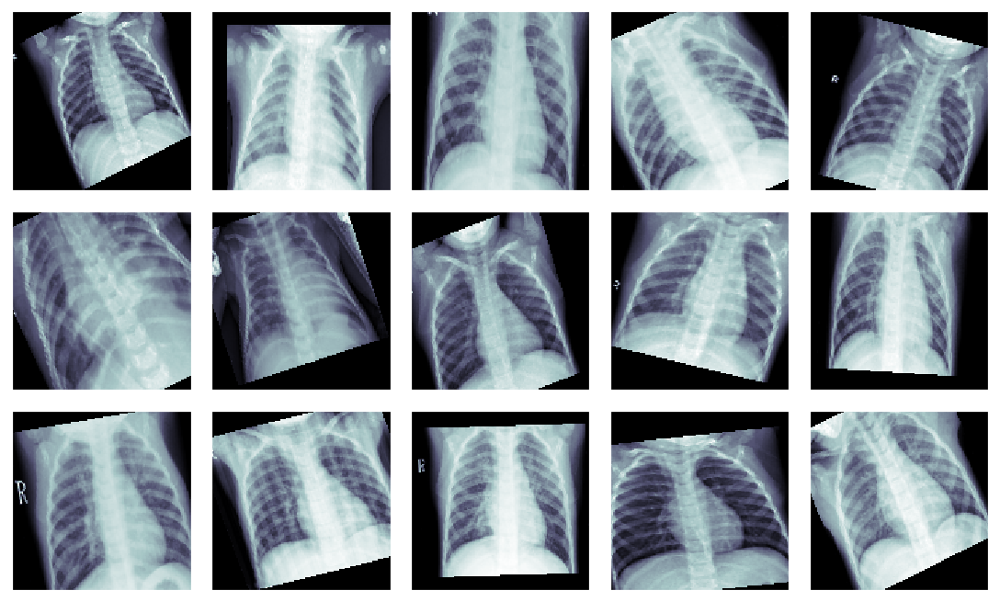

In [29]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(images[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

# Callback

In [30]:
os.mkdir('Model')
os.mkdir('History')

In [31]:
def get_callbacks():
    
    filepath = 'Model/best_model_multiclass_128.h5'
    callback1 = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    callback2 = MyLogger(val_generator, 
                         y_test = np.argmax(test_label, axis = 1),
                         class_labels = ['Normal', 'Viral', 'Bacterial'])
    
    callback3 = CSVLogger('History/Multiclass_Log_128.csv')

    return [callback1 ,callback2, callback3]

# Training

In [32]:
model = Network128(input_shape = (128, 128, 1), nb_class = 3, depth = 5)
model.summary() 

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 128, 128, 1)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 16) 416         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 128, 128, 16) 64          conv2d_1[0][0]                   
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 64, 64, 32)   4640        batch_normalization_1[0][0]      
____________________________________________________________________________________________

# Plotting Model

In [33]:
plot_model(model, show_shapes=True)

Epoch 1/70
326/326 [==============================] - 344s 1s/step - loss: 0.8429 - accuracy: 0.6166 - val_loss: 0.5181 - val_accuracy: 0.2372

Epoch 00001: val_accuracy improved from -inf to 0.23718, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 285ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:13.979419


---------------------
| Balanced Accuracy  |
---------------------

    0.3333333333333333


---------------------
|      Accuracy      |
---------------------

    0.23717948717948717


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       234
           1       0.00      0.00      0.00       242
           2       0.24      1.00      0.38       148

    accuracy                           0.24       624
   macro avg       0.08      0.33      0.13       624
weighted avg       0.06    

/opt/conda/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


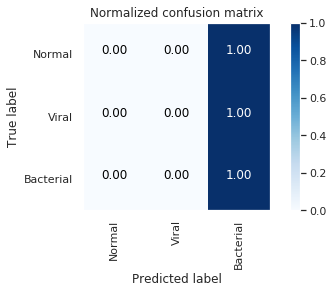

Epoch 2/70
326/326 [==============================] - 240s 738ms/step - loss: 0.7058 - accuracy: 0.6906 - val_loss: 0.7414 - val_accuracy: 0.4423

Epoch 00002: val_accuracy improved from 0.23718 to 0.44231, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.415407


---------------------
| Balanced Accuracy  |
---------------------

    0.449277790186881


---------------------
|      Accuracy      |
---------------------

    0.4423076923076923


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       234
           1       0.69      0.81      0.74       242
           2       0.23      0.53      0.33       148

    accuracy                           0.44       624
   macro avg       0.31      0.45      0.36       624
weighted avg       0.32 

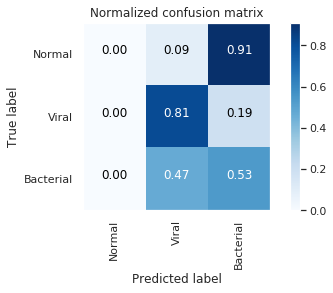

Epoch 3/70
326/326 [==============================] - 241s 740ms/step - loss: 0.6545 - accuracy: 0.7069 - val_loss: 2.6740 - val_accuracy: 0.7212

Epoch 00003: val_accuracy improved from 0.44231 to 0.72115, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.403430


---------------------
| Balanced Accuracy  |
---------------------

    0.6494883313065132


---------------------
|      Accuracy      |
---------------------

    0.7211538461538461


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.64      0.94      0.76       234
           1       0.83      0.86      0.84       242
           2       0.81      0.15      0.25       148

    accuracy                           0.72       624
   macro avg       0.76      0.65      0.62       624
weighted avg       0.75

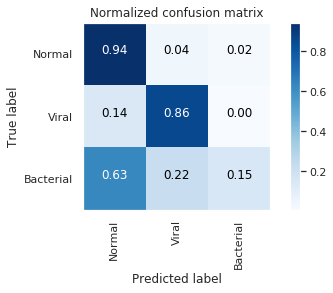

Epoch 4/70
326/326 [==============================] - 241s 739ms/step - loss: 0.6324 - accuracy: 0.7276 - val_loss: 1.6161 - val_accuracy: 0.7292

Epoch 00004: val_accuracy improved from 0.72115 to 0.72917, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.368432


---------------------
| Balanced Accuracy  |
---------------------

    0.6684892139437594


---------------------
|      Accuracy      |
---------------------

    0.7291666666666666


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.91      0.77      0.84       234
           1       0.64      0.98      0.77       242
           2       0.68      0.26      0.37       148

    accuracy                           0.73       624
   macro avg       0.74      0.67      0.66       624
weighted avg       0.75

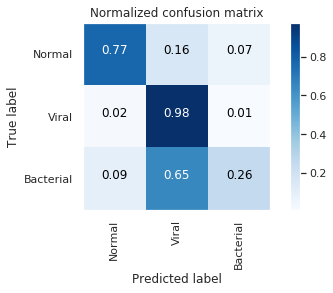

Epoch 5/70
326/326 [==============================] - 241s 738ms/step - loss: 0.6068 - accuracy: 0.7329 - val_loss: 1.0892 - val_accuracy: 0.7276

Epoch 00005: val_accuracy did not improve from 0.72917
Predicting test data
39/39 [==============================] - 5s 140ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.454650


---------------------
| Balanced Accuracy  |
---------------------

    0.6774613138249501


---------------------
|      Accuracy      |
---------------------

    0.7275641025641025


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.69      0.92      0.79       234
           1       0.79      0.79      0.79       242
           2       0.67      0.32      0.44       148

    accuracy                           0.73       624
   macro avg       0.72      0.68      0.67       624
weighted avg       0.72      0.73      0.71       624

--------------------
| C

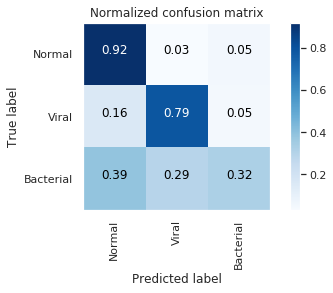

Epoch 6/70
326/326 [==============================] - 240s 737ms/step - loss: 0.5846 - accuracy: 0.7471 - val_loss: 1.3283 - val_accuracy: 0.7981

Epoch 00006: val_accuracy improved from 0.72917 to 0.79808, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.427910


---------------------
| Balanced Accuracy  |
---------------------

    0.7627513082058536


---------------------
|      Accuracy      |
---------------------

    0.7980769230769231


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.72      0.94      0.81       234
           1       0.90      0.84      0.87       242
           2       0.82      0.51      0.63       148

    accuracy                           0.80       624
   macro avg       0.81      0.76      0.77       624
weighted avg       0.81

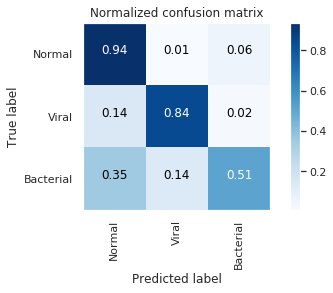

Epoch 7/70
326/326 [==============================] - 241s 739ms/step - loss: 0.5809 - accuracy: 0.7481 - val_loss: 1.4688 - val_accuracy: 0.7628

Epoch 00007: val_accuracy did not improve from 0.79808
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.406504


---------------------
| Balanced Accuracy  |
---------------------

    0.7106243242606879


---------------------
|      Accuracy      |
---------------------

    0.7628205128205128


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.67      0.94      0.78       234
           1       0.87      0.85      0.86       242
           2       0.82      0.34      0.49       148

    accuracy                           0.76       624
   macro avg       0.79      0.71      0.71       624
weighted avg       0.79      0.76      0.74       624

--------------------
| C

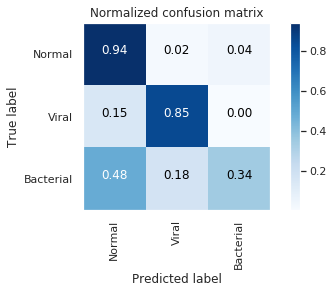

Epoch 8/70
326/326 [==============================] - 241s 740ms/step - loss: 0.5514 - accuracy: 0.7648 - val_loss: 1.4977 - val_accuracy: 0.7612

Epoch 00008: val_accuracy did not improve from 0.79808
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.414267


---------------------
| Balanced Accuracy  |
---------------------

    0.6947984220711493


---------------------
|      Accuracy      |
---------------------

    0.7612179487179487


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.67      0.98      0.80       234
           1       0.85      0.88      0.87       242
           2       0.97      0.23      0.37       148

    accuracy                           0.76       624
   macro avg       0.83      0.69      0.68       624
weighted avg       0.81      0.76      0.72       624

--------------------
| C

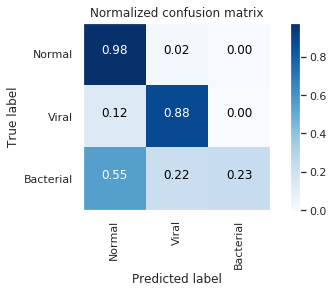

Epoch 9/70
326/326 [==============================] - 241s 738ms/step - loss: 0.5516 - accuracy: 0.7592 - val_loss: 1.2221 - val_accuracy: 0.7821

Epoch 00009: val_accuracy did not improve from 0.79808
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.370194


---------------------
| Balanced Accuracy  |
---------------------

    0.7400875128147856


---------------------
|      Accuracy      |
---------------------

    0.782051282051282


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.72      0.92      0.81       234
           1       0.85      0.85      0.85       242
           2       0.80      0.45      0.57       148

    accuracy                           0.78       624
   macro avg       0.79      0.74      0.74       624
weighted avg       0.79      0.78      0.77       624

--------------------
| Co

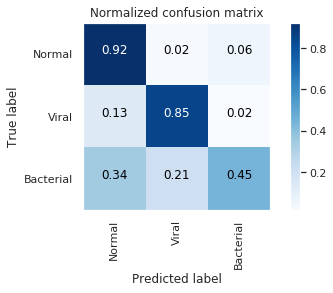

Epoch 10/70
326/326 [==============================] - 241s 739ms/step - loss: 0.5511 - accuracy: 0.7630 - val_loss: 0.7953 - val_accuracy: 0.8381

Epoch 00010: val_accuracy improved from 0.79808 to 0.83814, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.353770


---------------------
| Balanced Accuracy  |
---------------------

    0.8194144557780921


---------------------
|      Accuracy      |
---------------------

    0.8381410256410257


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.82      0.89      0.85       234
           1       0.88      0.88      0.88       242
           2       0.79      0.69      0.74       148

    accuracy                           0.84       624
   macro avg       0.83      0.82      0.82       624
weighted avg       0.8

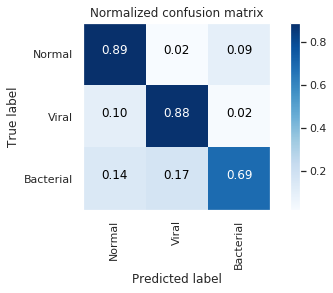

Epoch 11/70
326/326 [==============================] - 241s 738ms/step - loss: 0.5321 - accuracy: 0.7705 - val_loss: 1.2536 - val_accuracy: 0.7901

Epoch 00011: val_accuracy did not improve from 0.83814
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.382126


---------------------
| Balanced Accuracy  |
---------------------

    0.7533810033810034


---------------------
|      Accuracy      |
---------------------

    0.7900641025641025


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.70      0.95      0.80       234
           1       0.92      0.82      0.87       242
           2       0.80      0.49      0.61       148

    accuracy                           0.79       624
   macro avg       0.81      0.75      0.76       624
weighted avg       0.81      0.79      0.78       624

--------------------
| 

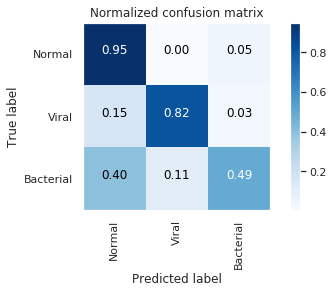

Epoch 12/70
326/326 [==============================] - 241s 738ms/step - loss: 0.5164 - accuracy: 0.7818 - val_loss: 1.1477 - val_accuracy: 0.8365

Epoch 00012: val_accuracy did not improve from 0.83814
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.432017


---------------------
| Balanced Accuracy  |
---------------------

    0.803824008369463


---------------------
|      Accuracy      |
---------------------

    0.8365384615384616


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.78      0.95      0.85       234
           1       0.89      0.89      0.89       242
           2       0.88      0.57      0.69       148

    accuracy                           0.84       624
   macro avg       0.85      0.80      0.81       624
weighted avg       0.84      0.84      0.83       624

--------------------
| C

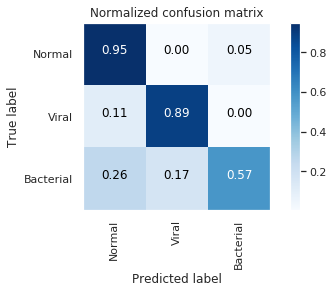

Epoch 13/70
326/326 [==============================] - 240s 737ms/step - loss: 0.5212 - accuracy: 0.7747 - val_loss: 1.3061 - val_accuracy: 0.6891

Epoch 00013: val_accuracy did not improve from 0.83814
Predicting test data
39/39 [==============================] - 5s 140ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.465404


---------------------
| Balanced Accuracy  |
---------------------

    0.6409187318278228


---------------------
|      Accuracy      |
---------------------

    0.6891025641025641


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.97      0.60      0.74       234
           1       0.57      1.00      0.73       242
           2       0.83      0.32      0.47       148

    accuracy                           0.69       624
   macro avg       0.79      0.64      0.65       624
weighted avg       0.78      0.69      0.67       624

--------------------
| 

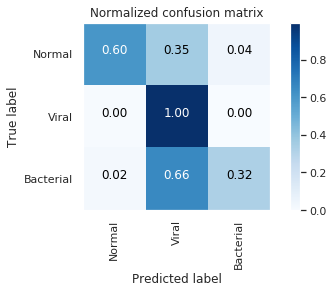

Epoch 14/70
326/326 [==============================] - 240s 737ms/step - loss: 0.5093 - accuracy: 0.7816 - val_loss: 1.9168 - val_accuracy: 0.7500

Epoch 00014: val_accuracy did not improve from 0.83814
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.424164


---------------------
| Balanced Accuracy  |
---------------------

    0.6766707903071539


---------------------
|      Accuracy      |
---------------------

    0.75


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.74      0.92      0.82       234
           1       0.75      0.94      0.83       242
           2       0.89      0.17      0.28       148

    accuracy                           0.75       624
   macro avg       0.79      0.68      0.65       624
weighted avg       0.78      0.75      0.70       624

--------------------
| Confusion Matr

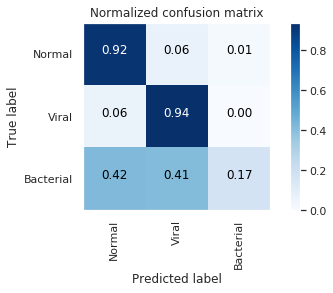

Epoch 15/70
326/326 [==============================] - 241s 739ms/step - loss: 0.5011 - accuracy: 0.7853 - val_loss: 1.9358 - val_accuracy: 0.7244

Epoch 00015: val_accuracy did not improve from 0.83814
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.415675


---------------------
| Balanced Accuracy  |
---------------------

    0.6637573683028228


---------------------
|      Accuracy      |
---------------------

    0.7243589743589743


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.61      0.96      0.74       234
           1       0.91      0.80      0.85       242
           2       0.81      0.24      0.37       148

    accuracy                           0.72       624
   macro avg       0.78      0.66      0.65       624
weighted avg       0.77      0.72      0.70       624

--------------------
| 

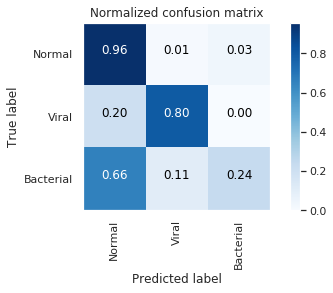

Epoch 16/70
326/326 [==============================] - 241s 738ms/step - loss: 0.5177 - accuracy: 0.7799 - val_loss: 0.6490 - val_accuracy: 0.8670

Epoch 00016: val_accuracy improved from 0.83814 to 0.86699, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.411076


---------------------
| Balanced Accuracy  |
---------------------

    0.8491743491743492


---------------------
|      Accuracy      |
---------------------

    0.8669871794871795


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.86      0.90       234
           1       0.84      0.95      0.89       242
           2       0.82      0.73      0.77       148

    accuracy                           0.87       624
   macro avg       0.86      0.85      0.85       624
weighted avg       0.8

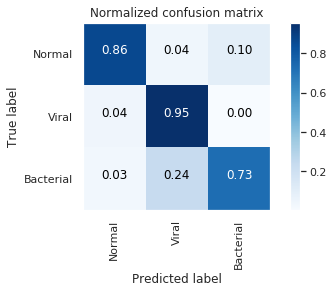

Epoch 17/70
326/326 [==============================] - 240s 737ms/step - loss: 0.5092 - accuracy: 0.7818 - val_loss: 1.1614 - val_accuracy: 0.8029

Epoch 00017: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.403687


---------------------
| Balanced Accuracy  |
---------------------

    0.7620384211293302


---------------------
|      Accuracy      |
---------------------

    0.8028846153846154


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.79      0.89      0.84       234
           1       0.82      0.91      0.86       242
           2       0.78      0.48      0.59       148

    accuracy                           0.80       624
   macro avg       0.80      0.76      0.77       624
weighted avg       0.80      0.80      0.79       624

--------------------
| 

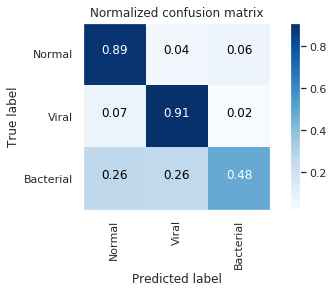

Epoch 18/70
326/326 [==============================] - 240s 737ms/step - loss: 0.4991 - accuracy: 0.7855 - val_loss: 0.6110 - val_accuracy: 0.8606

Epoch 00018: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.352962


---------------------
| Balanced Accuracy  |
---------------------

    0.8462421416966871


---------------------
|      Accuracy      |
---------------------

    0.8605769230769231


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.89      0.86      0.88       234
           1       0.86      0.93      0.89       242
           2       0.80      0.75      0.78       148

    accuracy                           0.86       624
   macro avg       0.85      0.85      0.85       624
weighted avg       0.86      0.86      0.86       624

--------------------
| 

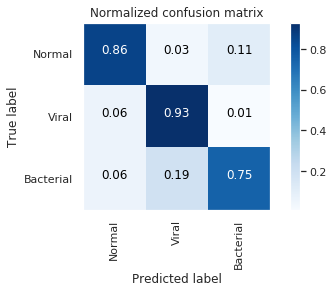

Epoch 19/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4880 - accuracy: 0.7891 - val_loss: 0.8815 - val_accuracy: 0.8494

Epoch 00019: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.381324


---------------------
| Balanced Accuracy  |
---------------------

    0.8186053186053185


---------------------
|      Accuracy      |
---------------------

    0.8493589743589743


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.88      0.89      0.89       234
           1       0.81      0.95      0.88       242
           2       0.87      0.61      0.72       148

    accuracy                           0.85       624
   macro avg       0.86      0.82      0.83       624
weighted avg       0.85      0.85      0.84       624

--------------------
| 

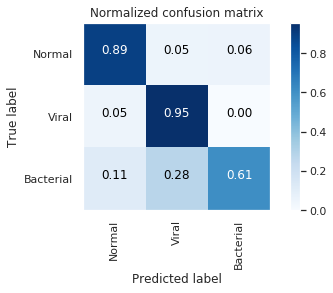

Epoch 20/70
326/326 [==============================] - 240s 735ms/step - loss: 0.5006 - accuracy: 0.7824 - val_loss: 0.5980 - val_accuracy: 0.8446

Epoch 00020: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.387054


---------------------
| Balanced Accuracy  |
---------------------

    0.838807497898407


---------------------
|      Accuracy      |
---------------------

    0.844551282051282


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.92      0.80      0.86       234
           1       0.88      0.91      0.90       242
           2       0.70      0.80      0.75       148

    accuracy                           0.84       624
   macro avg       0.83      0.84      0.83       624
weighted avg       0.85      0.84      0.85       624

--------------------
| Co

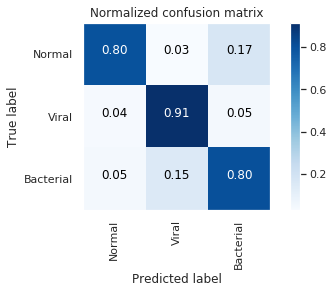

Epoch 21/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4919 - accuracy: 0.7941 - val_loss: 1.3561 - val_accuracy: 0.8029

Epoch 00021: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.355288


---------------------
| Balanced Accuracy  |
---------------------

    0.7517286835468653


---------------------
|      Accuracy      |
---------------------

    0.8028846153846154


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.83      0.91      0.87       234
           1       0.78      0.95      0.86       242
           2       0.80      0.40      0.53       148

    accuracy                           0.80       624
   macro avg       0.80      0.75      0.75       624
weighted avg       0.80      0.80      0.78       624

--------------------
| 

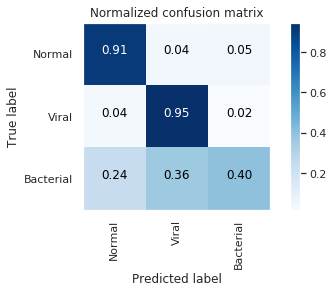

Epoch 22/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4770 - accuracy: 0.7939 - val_loss: 0.6135 - val_accuracy: 0.8718

Epoch 00022: val_accuracy improved from 0.86699 to 0.87179, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.372165


---------------------
| Balanced Accuracy  |
---------------------

    0.8637575910303182


---------------------
|      Accuracy      |
---------------------

    0.8717948717948718


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.86      0.89       234
           1       0.89      0.92      0.91       242
           2       0.76      0.81      0.79       148

    accuracy                           0.87       624
   macro avg       0.86      0.86      0.86       624
weighted avg       0.8

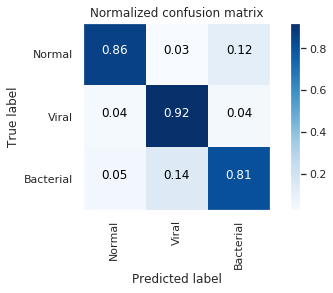

Epoch 23/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4876 - accuracy: 0.7906 - val_loss: 1.2742 - val_accuracy: 0.8157

Epoch 00023: val_accuracy did not improve from 0.87179
Predicting test data
39/39 [==============================] - 5s 141ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.483543


---------------------
| Balanced Accuracy  |
---------------------

    0.7665769711224257


---------------------
|      Accuracy      |
---------------------

    0.8157051282051282


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.75      0.94      0.83       234
           1       0.87      0.93      0.90       242
           2       0.89      0.43      0.58       148

    accuracy                           0.82       624
   macro avg       0.84      0.77      0.77       624
weighted avg       0.83      0.82      0.80       624

--------------------
| 

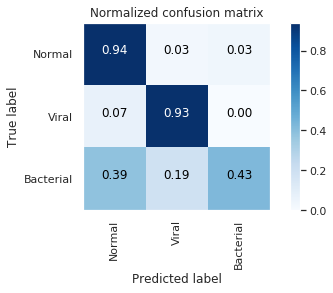

Epoch 24/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4780 - accuracy: 0.7966 - val_loss: 3.2360 - val_accuracy: 0.7019

Epoch 00024: val_accuracy did not improve from 0.87179
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.398953


---------------------
| Balanced Accuracy  |
---------------------

    0.6185109139654594


---------------------
|      Accuracy      |
---------------------

    0.7019230769230769


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.61      0.98      0.75       234
           1       0.85      0.84      0.85       242
           2       0.83      0.03      0.06       148

    accuracy                           0.70       624
   macro avg       0.76      0.62      0.55       624
weighted avg       0.76      0.70      0.62       624

--------------------
| 

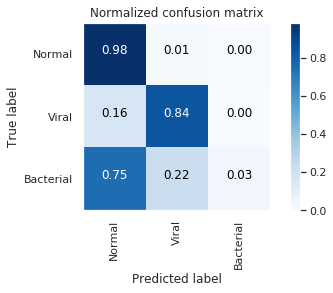

Epoch 25/70
326/326 [==============================] - 240s 737ms/step - loss: 0.4710 - accuracy: 0.7987 - val_loss: 1.3355 - val_accuracy: 0.7756

Epoch 00025: val_accuracy did not improve from 0.87179
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.396434


---------------------
| Balanced Accuracy  |
---------------------

    0.726751385842295


---------------------
|      Accuracy      |
---------------------

    0.7756410256410257


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.71      0.93      0.80       234
           1       0.86      0.87      0.86       242
           2       0.78      0.39      0.52       148

    accuracy                           0.78       624
   macro avg       0.78      0.73      0.73       624
weighted avg       0.78      0.78      0.76       624

--------------------
| C

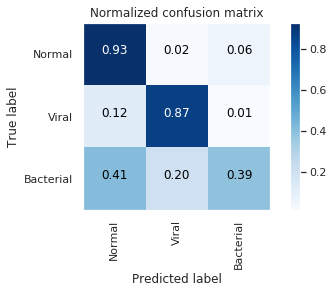

Epoch 26/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4780 - accuracy: 0.7887 - val_loss: 0.5403 - val_accuracy: 0.6971

Epoch 00026: val_accuracy did not improve from 0.87179
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.354364


---------------------
| Balanced Accuracy  |
---------------------

    0.7071411844139117


---------------------
|      Accuracy      |
---------------------

    0.6971153846153846


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.99      0.35      0.52       234
           1       0.75      0.97      0.85       242
           2       0.52      0.80      0.63       148

    accuracy                           0.70       624
   macro avg       0.75      0.71      0.66       624
weighted avg       0.78      0.70      0.67       624

--------------------
| 

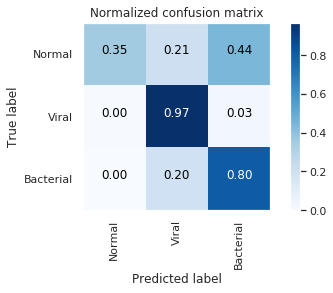

Epoch 27/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4771 - accuracy: 0.7987 - val_loss: 0.4645 - val_accuracy: 0.8782

Epoch 00027: val_accuracy improved from 0.87179 to 0.87821, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.380515


---------------------
| Balanced Accuracy  |
---------------------

    0.8683453001634819


---------------------
|      Accuracy      |
---------------------

    0.8782051282051282


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.85      0.89       234
           1       0.88      0.95      0.91       242
           2       0.79      0.80      0.80       148

    accuracy                           0.88       624
   macro avg       0.87      0.87      0.87       624
weighted avg       0.8

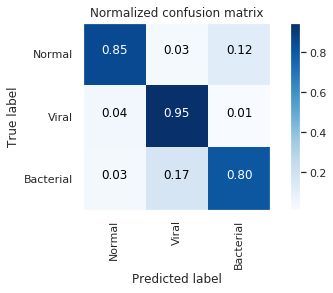

Epoch 28/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4686 - accuracy: 0.8021 - val_loss: 0.7334 - val_accuracy: 0.8798

Epoch 00028: val_accuracy improved from 0.87821 to 0.87981, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.380025


---------------------
| Balanced Accuracy  |
---------------------

    0.8661490479672298


---------------------
|      Accuracy      |
---------------------

    0.8798076923076923


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.87      0.93      0.90       234
           1       0.92      0.90      0.91       242
           2       0.83      0.77      0.80       148

    accuracy                           0.88       624
   macro avg       0.87      0.87      0.87       624
weighted avg       0.8

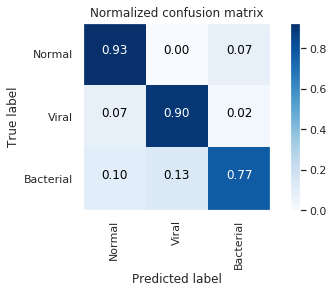

Epoch 29/70
326/326 [==============================] - 240s 738ms/step - loss: 0.4772 - accuracy: 0.7876 - val_loss: 0.5434 - val_accuracy: 0.8494

Epoch 00029: val_accuracy did not improve from 0.87981
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.417461


---------------------
| Balanced Accuracy  |
---------------------

    0.836768745859655


---------------------
|      Accuracy      |
---------------------

    0.8493589743589743


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.96      0.79      0.87       234
           1       0.84      0.96      0.89       242
           2       0.73      0.76      0.74       148

    accuracy                           0.85       624
   macro avg       0.84      0.84      0.84       624
weighted avg       0.86      0.85      0.85       624

--------------------
| C

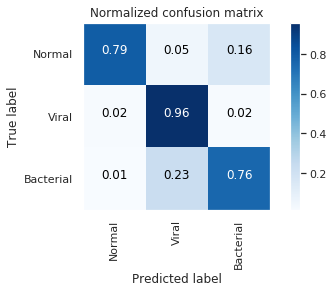

Epoch 30/70
326/326 [==============================] - 240s 737ms/step - loss: 0.4554 - accuracy: 0.8043 - val_loss: 1.1870 - val_accuracy: 0.8013

Epoch 00030: val_accuracy did not improve from 0.87981
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.377626


---------------------
| Balanced Accuracy  |
---------------------

    0.7481976572885664


---------------------
|      Accuracy      |
---------------------

    0.8012820512820513


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.72      0.95      0.82       234
           1       0.88      0.91      0.89       242
           2       0.88      0.38      0.53       148

    accuracy                           0.80       624
   macro avg       0.83      0.75      0.75       624
weighted avg       0.82      0.80      0.78       624

--------------------
| 

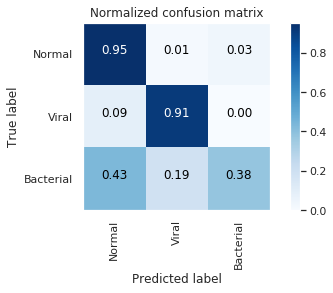

Epoch 31/70
326/326 [==============================] - 241s 739ms/step - loss: 0.4539 - accuracy: 0.8085 - val_loss: 0.6838 - val_accuracy: 0.8718

Epoch 00031: val_accuracy did not improve from 0.87981
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.387502


---------------------
| Balanced Accuracy  |
---------------------

    0.855931105931106


---------------------
|      Accuracy      |
---------------------

    0.8717948717948718


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.95      0.86      0.91       234
           1       0.83      0.95      0.89       242
           2       0.82      0.75      0.78       148

    accuracy                           0.87       624
   macro avg       0.87      0.86      0.86       624
weighted avg       0.88      0.87      0.87       624

--------------------
| C

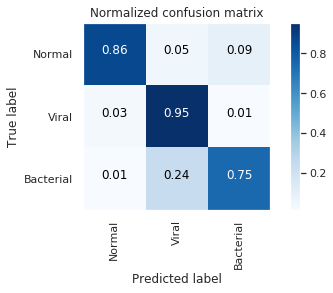

Epoch 32/70
326/326 [==============================] - 241s 739ms/step - loss: 0.4525 - accuracy: 0.8033 - val_loss: 0.3832 - val_accuracy: 0.8814

Epoch 00032: val_accuracy improved from 0.87981 to 0.88141, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 140ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.461057


---------------------
| Balanced Accuracy  |
---------------------

    0.8798956298956299


---------------------
|      Accuracy      |
---------------------

    0.8814102564102564


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.94      0.86      0.90       234
           1       0.93      0.91      0.92       242
           2       0.75      0.87      0.80       148

    accuracy                           0.88       624
   macro avg       0.87      0.88      0.87       624
weighted avg       0.8

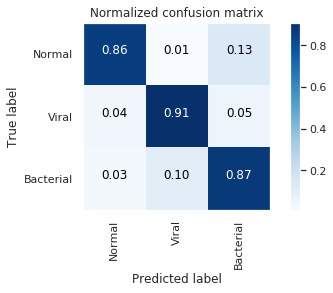

Epoch 33/70
326/326 [==============================] - 240s 737ms/step - loss: 0.4569 - accuracy: 0.7998 - val_loss: 0.9926 - val_accuracy: 0.8077

Epoch 00033: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 140ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.475709


---------------------
| Balanced Accuracy  |
---------------------

    0.7771469816924362


---------------------
|      Accuracy      |
---------------------

    0.8076923076923077


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.98      0.78      0.87       234
           1       0.74      0.98      0.84       242
           2       0.73      0.57      0.64       148

    accuracy                           0.81       624
   macro avg       0.82      0.78      0.78       624
weighted avg       0.83      0.81      0.80       624

--------------------
| 

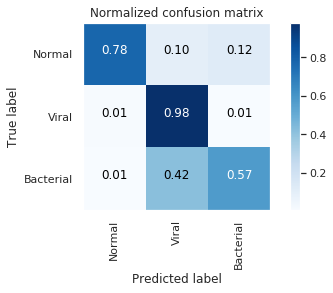

Epoch 34/70
326/326 [==============================] - 241s 738ms/step - loss: 0.4465 - accuracy: 0.8071 - val_loss: 1.4473 - val_accuracy: 0.8606

Epoch 00034: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.418532


---------------------
| Balanced Accuracy  |
---------------------

    0.8221431857795495


---------------------
|      Accuracy      |
---------------------

    0.8605769230769231


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.82      0.97      0.89       234
           1       0.89      0.94      0.91       242
           2       0.90      0.55      0.69       148

    accuracy                           0.86       624
   macro avg       0.87      0.82      0.83       624
weighted avg       0.87      0.86      0.85       624

--------------------
| 

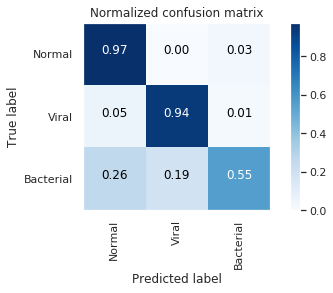

Epoch 35/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4366 - accuracy: 0.8112 - val_loss: 0.3876 - val_accuracy: 0.7740

Epoch 00035: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.388650


---------------------
| Balanced Accuracy  |
---------------------

    0.7890563799654707


---------------------
|      Accuracy      |
---------------------

    0.7740384615384616


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.97      0.75      0.85       234
           1       0.86      0.72      0.79       242
           2       0.55      0.89      0.68       148

    accuracy                           0.77       624
   macro avg       0.79      0.79      0.77       624
weighted avg       0.83      0.77      0.78       624

--------------------
| 

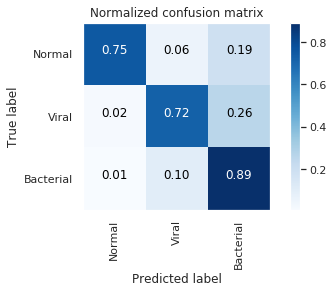

Epoch 36/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4334 - accuracy: 0.8144 - val_loss: 0.4930 - val_accuracy: 0.8814

Epoch 00036: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.356833


---------------------
| Balanced Accuracy  |
---------------------

    0.865400047218229


---------------------
|      Accuracy      |
---------------------

    0.8814102564102564


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       234
           1       0.88      0.95      0.91       242
           2       0.83      0.76      0.79       148

    accuracy                           0.88       624
   macro avg       0.87      0.87      0.87       624
weighted avg       0.88      0.88      0.88       624

--------------------
| C

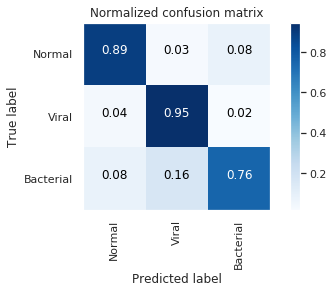

Epoch 37/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4395 - accuracy: 0.8094 - val_loss: 1.7178 - val_accuracy: 0.7388

Epoch 00037: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.374968


---------------------
| Balanced Accuracy  |
---------------------

    0.6592024319297046


---------------------
|      Accuracy      |
---------------------

    0.7387820512820513


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.79      0.93      0.86       234
           1       0.69      0.94      0.80       242
           2       0.76      0.11      0.19       148

    accuracy                           0.74       624
   macro avg       0.75      0.66      0.61       624
weighted avg       0.75      0.74      0.68       624

--------------------
| 

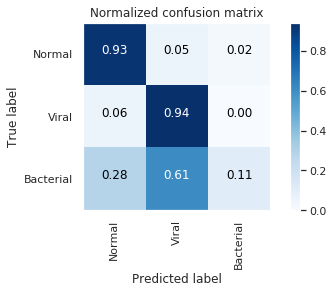

Epoch 38/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4276 - accuracy: 0.8163 - val_loss: 0.6620 - val_accuracy: 0.7997

Epoch 00038: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.399361


---------------------
| Balanced Accuracy  |
---------------------

    0.8031815986361441


---------------------
|      Accuracy      |
---------------------

    0.7996794871794872


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.99      0.59      0.74       234
           1       0.81      0.98      0.89       242
           2       0.64      0.84      0.73       148

    accuracy                           0.80       624
   macro avg       0.82      0.80      0.79       624
weighted avg       0.84      0.80      0.79       624

--------------------
| 

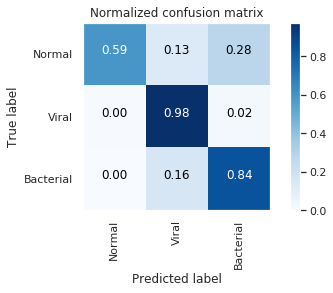

Epoch 39/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4152 - accuracy: 0.8225 - val_loss: 0.6080 - val_accuracy: 0.8622

Epoch 00039: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.380590


---------------------
| Balanced Accuracy  |
---------------------

    0.8560582196945834


---------------------
|      Accuracy      |
---------------------

    0.8621794871794872


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.86      0.91      0.89       234
           1       0.92      0.85      0.88       242
           2       0.78      0.81      0.79       148

    accuracy                           0.86       624
   macro avg       0.85      0.86      0.85       624
weighted avg       0.86      0.86      0.86       624

--------------------
| 

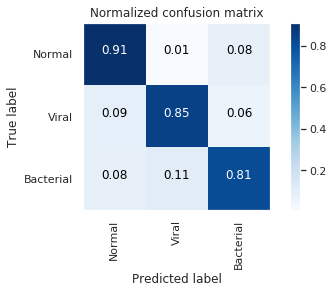

Epoch 40/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4251 - accuracy: 0.8148 - val_loss: 0.8938 - val_accuracy: 0.8782

Epoch 00040: val_accuracy did not improve from 0.88141
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.408797


---------------------
| Balanced Accuracy  |
---------------------

    0.8574903574903575


---------------------
|      Accuracy      |
---------------------

    0.8782051282051282


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.91      0.90      0.91       234
           1       0.87      0.95      0.91       242
           2       0.84      0.72      0.77       148

    accuracy                           0.88       624
   macro avg       0.87      0.86      0.86       624
weighted avg       0.88      0.88      0.88       624

--------------------
| 

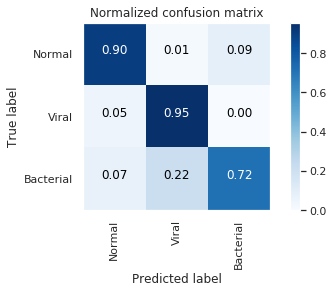

Epoch 41/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4140 - accuracy: 0.8244 - val_loss: 0.6571 - val_accuracy: 0.8846

Epoch 00041: val_accuracy improved from 0.88141 to 0.88462, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.340390


---------------------
| Balanced Accuracy  |
---------------------

    0.8746356019083291


---------------------
|      Accuracy      |
---------------------

    0.8846153846153846


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.96      0.85      0.90       234
           1       0.88      0.97      0.92       242
           2       0.79      0.81      0.80       148

    accuracy                           0.88       624
   macro avg       0.88      0.87      0.87       624
weighted avg       0.8

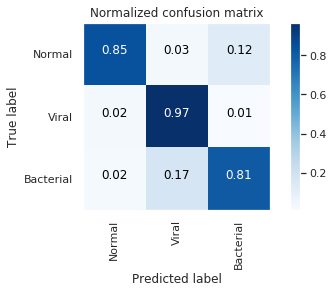

Epoch 42/70
326/326 [==============================] - 240s 737ms/step - loss: 0.4167 - accuracy: 0.8198 - val_loss: 0.9704 - val_accuracy: 0.8654

Epoch 00042: val_accuracy did not improve from 0.88462
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.417626


---------------------
| Balanced Accuracy  |
---------------------

    0.8397077942532488


---------------------
|      Accuracy      |
---------------------

    0.8653846153846154


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.86      0.92      0.89       234
           1       0.87      0.93      0.90       242
           2       0.86      0.66      0.75       148

    accuracy                           0.87       624
   macro avg       0.86      0.84      0.85       624
weighted avg       0.87      0.87      0.86       624

--------------------
| 

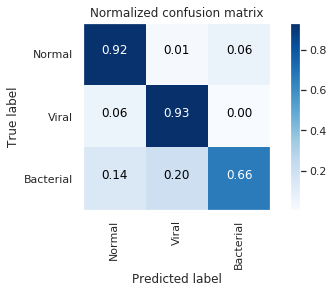

Epoch 43/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4126 - accuracy: 0.8188 - val_loss: 0.9161 - val_accuracy: 0.8622

Epoch 00043: val_accuracy did not improve from 0.88462
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.394240


---------------------
| Balanced Accuracy  |
---------------------

    0.8282516464334647


---------------------
|      Accuracy      |
---------------------

    0.8621794871794872


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.88      0.93      0.90       234
           1       0.85      0.96      0.90       242
           2       0.85      0.59      0.70       148

    accuracy                           0.86       624
   macro avg       0.86      0.83      0.84       624
weighted avg       0.86      0.86      0.85       624

--------------------
| 

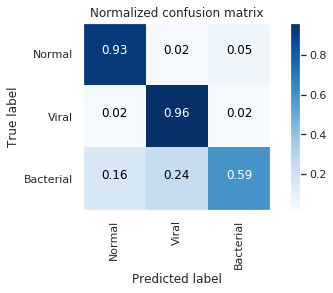

Epoch 44/70
326/326 [==============================] - 239s 735ms/step - loss: 0.4053 - accuracy: 0.8238 - val_loss: 0.7464 - val_accuracy: 0.8734

Epoch 00044: val_accuracy did not improve from 0.88462
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.372719


---------------------
| Balanced Accuracy  |
---------------------

    0.8610433383160657


---------------------
|      Accuracy      |
---------------------

    0.8733974358974359


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.92      0.88      0.90       234
           1       0.88      0.92      0.90       242
           2       0.79      0.78      0.78       148

    accuracy                           0.87       624
   macro avg       0.86      0.86      0.86       624
weighted avg       0.87      0.87      0.87       624

--------------------
| 

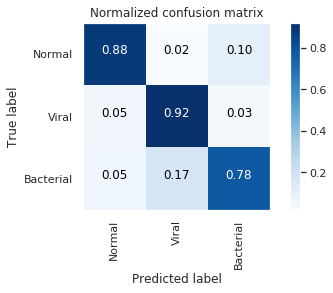

Epoch 45/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4078 - accuracy: 0.8275 - val_loss: 0.4018 - val_accuracy: 0.8654

Epoch 00045: val_accuracy did not improve from 0.88462
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.380233


---------------------
| Balanced Accuracy  |
---------------------

    0.865482138209411


---------------------
|      Accuracy      |
---------------------

    0.8653846153846154


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.88      0.90       234
           1       0.93      0.85      0.89       242
           2       0.71      0.86      0.78       148

    accuracy                           0.87       624
   macro avg       0.86      0.87      0.86       624
weighted avg       0.88      0.87      0.87       624

--------------------
| C

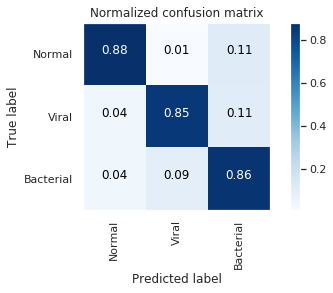

Epoch 46/70
326/326 [==============================] - 240s 736ms/step - loss: 0.4039 - accuracy: 0.8288 - val_loss: 0.6630 - val_accuracy: 0.8862

Epoch 00046: val_accuracy improved from 0.88462 to 0.88622, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.401924


---------------------
| Balanced Accuracy  |
---------------------

    0.8675942312305948


---------------------
|      Accuracy      |
---------------------

    0.8862179487179487


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       234
           1       0.85      0.98      0.91       242
           2       0.84      0.74      0.79       148

    accuracy                           0.89       624
   macro avg       0.88      0.87      0.87       624
weighted avg       0.8

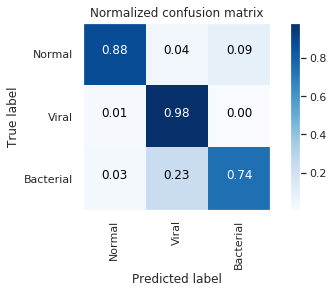

Epoch 47/70
326/326 [==============================] - 239s 734ms/step - loss: 0.3868 - accuracy: 0.8351 - val_loss: 0.8718 - val_accuracy: 0.8814

Epoch 00047: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.380413


---------------------
| Balanced Accuracy  |
---------------------

    0.8605748151202697


---------------------
|      Accuracy      |
---------------------

    0.8814102564102564


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.88      0.93      0.91       234
           1       0.89      0.93      0.91       242
           2       0.85      0.72      0.78       148

    accuracy                           0.88       624
   macro avg       0.88      0.86      0.87       624
weighted avg       0.88      0.88      0.88       624

--------------------
| 

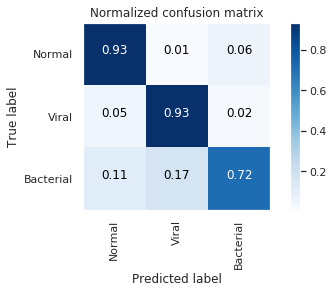

Epoch 48/70
326/326 [==============================] - 240s 735ms/step - loss: 0.4075 - accuracy: 0.8292 - val_loss: 0.3435 - val_accuracy: 0.8686

Epoch 00048: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.403344


---------------------
| Balanced Accuracy  |
---------------------

    0.858425335698063


---------------------
|      Accuracy      |
---------------------

    0.8685897435897436


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.98      0.86      0.92       234
           1       0.87      0.92      0.90       242
           2       0.72      0.79      0.75       148

    accuracy                           0.87       624
   macro avg       0.86      0.86      0.86       624
weighted avg       0.88      0.87      0.87       624

--------------------
| C

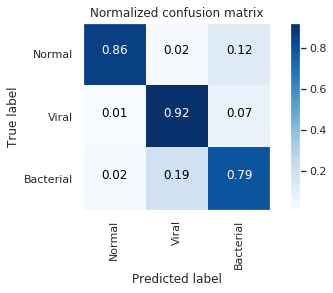

Epoch 49/70
326/326 [==============================] - 240s 735ms/step - loss: 0.3899 - accuracy: 0.8317 - val_loss: 0.3664 - val_accuracy: 0.8590

Epoch 00049: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.392224


---------------------
| Balanced Accuracy  |
---------------------

    0.8554570145479237


---------------------
|      Accuracy      |
---------------------

    0.8589743589743589


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.87      0.90       234
           1       0.91      0.87      0.89       242
           2       0.71      0.83      0.76       148

    accuracy                           0.86       624
   macro avg       0.85      0.86      0.85       624
weighted avg       0.87      0.86      0.86       624

--------------------
| 

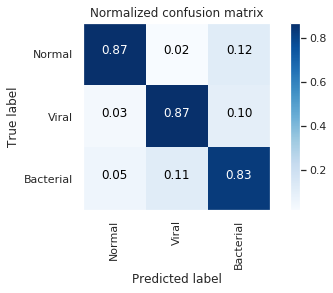

Epoch 50/70
326/326 [==============================] - 240s 736ms/step - loss: 0.3856 - accuracy: 0.8321 - val_loss: 0.5410 - val_accuracy: 0.8702

Epoch 00050: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.365237


---------------------
| Balanced Accuracy  |
---------------------

    0.8681472317835954


---------------------
|      Accuracy      |
---------------------

    0.8701923076923077


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       234
           1       0.92      0.85      0.88       242
           2       0.72      0.85      0.78       148

    accuracy                           0.87       624
   macro avg       0.86      0.87      0.86       624
weighted avg       0.88      0.87      0.87       624

--------------------
| 

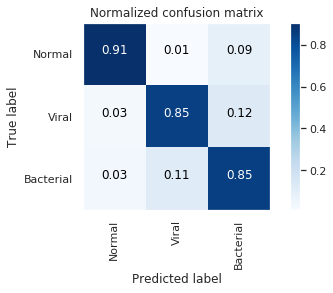

Epoch 51/70
326/326 [==============================] - 240s 735ms/step - loss: 0.3755 - accuracy: 0.8347 - val_loss: 0.7420 - val_accuracy: 0.8718

Epoch 00051: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.342770


---------------------
| Balanced Accuracy  |
---------------------

    0.8519807156170792


---------------------
|      Accuracy      |
---------------------

    0.8717948717948718


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.90      0.90      0.90       234
           1       0.87      0.94      0.90       242
           2       0.82      0.72      0.76       148

    accuracy                           0.87       624
   macro avg       0.86      0.85      0.86       624
weighted avg       0.87      0.87      0.87       624

--------------------
| 

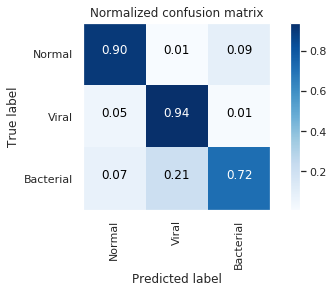

Epoch 52/70
326/326 [==============================] - 240s 736ms/step - loss: 0.3731 - accuracy: 0.8426 - val_loss: 1.0119 - val_accuracy: 0.8846

Epoch 00052: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.385671


---------------------
| Balanced Accuracy  |
---------------------

    0.8580334943971307


---------------------
|      Accuracy      |
---------------------

    0.8846153846153846


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.92      0.93      0.93       234
           1       0.86      0.97      0.91       242
           2       0.87      0.68      0.76       148

    accuracy                           0.88       624
   macro avg       0.88      0.86      0.87       624
weighted avg       0.89      0.88      0.88       624

--------------------
| 

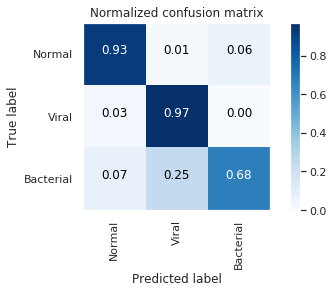

Epoch 53/70
326/326 [==============================] - 240s 736ms/step - loss: 0.3798 - accuracy: 0.8395 - val_loss: 1.0259 - val_accuracy: 0.8702

Epoch 00053: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.414981


---------------------
| Balanced Accuracy  |
---------------------

    0.8389206116478843


---------------------
|      Accuracy      |
---------------------

    0.8701923076923077


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.86      0.95      0.90       234
           1       0.87      0.94      0.90       242
           2       0.89      0.62      0.73       148

    accuracy                           0.87       624
   macro avg       0.87      0.84      0.85       624
weighted avg       0.87      0.87      0.86       624

--------------------
| 

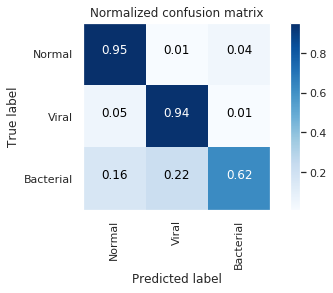

Epoch 54/70
326/326 [==============================] - 240s 736ms/step - loss: 0.3619 - accuracy: 0.8480 - val_loss: 0.8740 - val_accuracy: 0.8734

Epoch 00054: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.396979


---------------------
| Balanced Accuracy  |
---------------------

    0.8565749474840384


---------------------
|      Accuracy      |
---------------------

    0.8733974358974359


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.92      0.88      0.90       234
           1       0.89      0.95      0.92       242
           2       0.76      0.74      0.75       148

    accuracy                           0.87       624
   macro avg       0.86      0.86      0.86       624
weighted avg       0.87      0.87      0.87       624

--------------------
| 

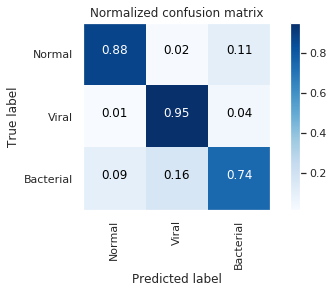

Epoch 55/70
326/326 [==============================] - 240s 735ms/step - loss: 0.3639 - accuracy: 0.8413 - val_loss: 0.8827 - val_accuracy: 0.8702

Epoch 00055: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 139ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.405054


---------------------
| Balanced Accuracy  |
---------------------

    0.8362489953399045


---------------------
|      Accuracy      |
---------------------

    0.8701923076923077


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.89       234
           1       0.89      0.96      0.92       242
           2       0.89      0.60      0.72       148

    accuracy                           0.87       624
   macro avg       0.87      0.84      0.84       624
weighted avg       0.87      0.87      0.86       624

--------------------
| 

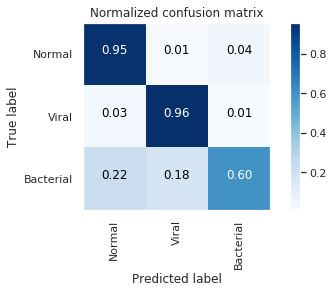

Epoch 56/70
326/326 [==============================] - 240s 735ms/step - loss: 0.3530 - accuracy: 0.8503 - val_loss: 0.7847 - val_accuracy: 0.8574

Epoch 00056: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.391653


---------------------
| Balanced Accuracy  |
---------------------

    0.8452568907114362


---------------------
|      Accuracy      |
---------------------

    0.8573717948717948


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.86      0.94      0.90       234
           1       0.92      0.84      0.88       242
           2       0.76      0.76      0.76       148

    accuracy                           0.86       624
   macro avg       0.85      0.85      0.84       624
weighted avg       0.86      0.86      0.86       624

--------------------
| 

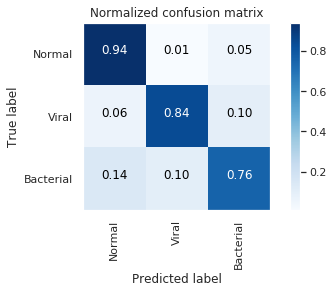

Epoch 57/70
326/326 [==============================] - 240s 735ms/step - loss: 0.3476 - accuracy: 0.8495 - val_loss: 0.4272 - val_accuracy: 0.8734

Epoch 00057: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.383247


---------------------
| Balanced Accuracy  |
---------------------

    0.8715414397232578


---------------------
|      Accuracy      |
---------------------

    0.8733974358974359


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       234
           1       0.94      0.87      0.91       242
           2       0.75      0.86      0.80       148

    accuracy                           0.87       624
   macro avg       0.86      0.87      0.87       624
weighted avg       0.88      0.87      0.88       624

--------------------
| 

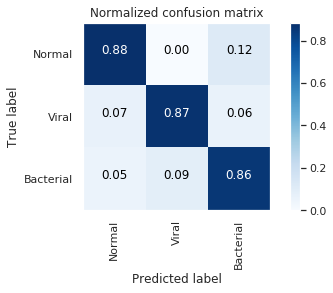

Epoch 58/70
326/326 [==============================] - 240s 736ms/step - loss: 0.3454 - accuracy: 0.8485 - val_loss: 0.8594 - val_accuracy: 0.8381

Epoch 00058: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.363150


---------------------
| Balanced Accuracy  |
---------------------

    0.8172608399881128


---------------------
|      Accuracy      |
---------------------

    0.8381410256410257


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.83      0.93      0.88       234
           1       0.90      0.85      0.87       242
           2       0.76      0.67      0.71       148

    accuracy                           0.84       624
   macro avg       0.83      0.82      0.82       624
weighted avg       0.84      0.84      0.84       624

--------------------
| 

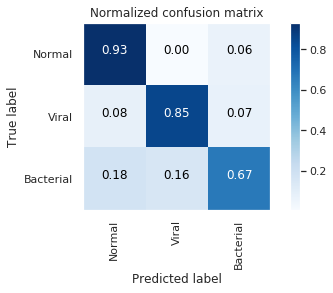

Epoch 59/70
326/326 [==============================] - 240s 736ms/step - loss: 0.3379 - accuracy: 0.8537 - val_loss: 0.9078 - val_accuracy: 0.8830

Epoch 00059: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.397400


---------------------
| Balanced Accuracy  |
---------------------

    0.862874158328704


---------------------
|      Accuracy      |
---------------------

    0.8830128205128205


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.86      0.94      0.90       234
           1       0.93      0.93      0.93       242
           2       0.84      0.72      0.78       148

    accuracy                           0.88       624
   macro avg       0.88      0.86      0.87       624
weighted avg       0.88      0.88      0.88       624

--------------------
| C

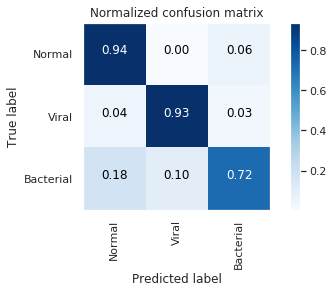

Epoch 60/70
326/326 [==============================] - 240s 735ms/step - loss: 0.3368 - accuracy: 0.8535 - val_loss: 0.7565 - val_accuracy: 0.8750

Epoch 00060: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.365292


---------------------
| Balanced Accuracy  |
---------------------

    0.8526562162925799


---------------------
|      Accuracy      |
---------------------

    0.875


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.95      0.87      0.91       234
           1       0.84      0.98      0.91       242
           2       0.82      0.70      0.76       148

    accuracy                           0.88       624
   macro avg       0.87      0.85      0.86       624
weighted avg       0.88      0.88      0.87       624

--------------------
| Confusion Mat

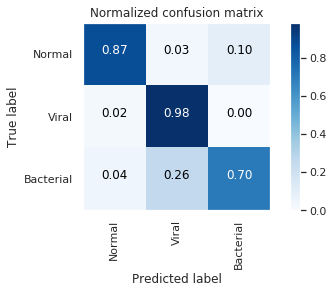

Epoch 61/70
326/326 [==============================] - 240s 735ms/step - loss: 0.3280 - accuracy: 0.8602 - val_loss: 1.6280 - val_accuracy: 0.8253

Epoch 00061: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.370358


---------------------
| Balanced Accuracy  |
---------------------

    0.7812949631131448


---------------------
|      Accuracy      |
---------------------

    0.8253205128205128


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.79      0.97      0.87       234
           1       0.85      0.90      0.88       242
           2       0.88      0.47      0.61       148

    accuracy                           0.83       624
   macro avg       0.84      0.78      0.79       624
weighted avg       0.83      0.83      0.81       624

--------------------
| 

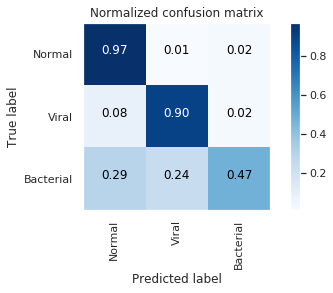

Epoch 62/70
326/326 [==============================] - 240s 736ms/step - loss: 0.3259 - accuracy: 0.8625 - val_loss: 0.4584 - val_accuracy: 0.8734

Epoch 00062: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.391581


---------------------
| Balanced Accuracy  |
---------------------

    0.8670259579350489


---------------------
|      Accuracy      |
---------------------

    0.8733974358974359


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.96      0.87      0.91       234
           1       0.90      0.90      0.90       242
           2       0.73      0.82      0.77       148

    accuracy                           0.87       624
   macro avg       0.86      0.87      0.86       624
weighted avg       0.88      0.87      0.88       624

--------------------
| 

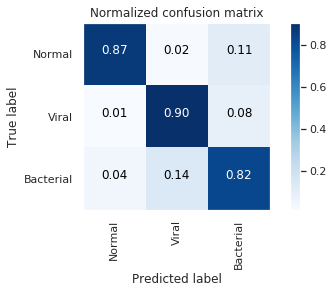

Epoch 63/70
326/326 [==============================] - 239s 734ms/step - loss: 0.3222 - accuracy: 0.8641 - val_loss: 0.6583 - val_accuracy: 0.8702

Epoch 00063: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.380339


---------------------
| Balanced Accuracy  |
---------------------

    0.860367837640565


---------------------
|      Accuracy      |
---------------------

    0.8701923076923077


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       234
           1       0.89      0.88      0.88       242
           2       0.75      0.79      0.77       148

    accuracy                           0.87       624
   macro avg       0.86      0.86      0.86       624
weighted avg       0.87      0.87      0.87       624

--------------------
| C

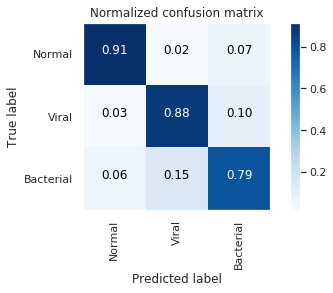

Epoch 64/70
326/326 [==============================] - 239s 735ms/step - loss: 0.3149 - accuracy: 0.8629 - val_loss: 1.3298 - val_accuracy: 0.8622

Epoch 00064: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.402629


---------------------
| Balanced Accuracy  |
---------------------

    0.8311587175223538


---------------------
|      Accuracy      |
---------------------

    0.8621794871794872


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.84      0.95      0.90       234
           1       0.90      0.93      0.91       242
           2       0.82      0.61      0.70       148

    accuracy                           0.86       624
   macro avg       0.85      0.83      0.84       624
weighted avg       0.86      0.86      0.86       624

--------------------
| 

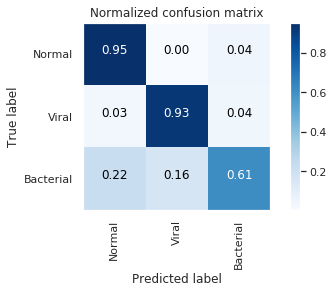

Epoch 65/70
326/326 [==============================] - 240s 737ms/step - loss: 0.3134 - accuracy: 0.8646 - val_loss: 0.6761 - val_accuracy: 0.8654

Epoch 00065: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 138ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.392736


---------------------
| Balanced Accuracy  |
---------------------

    0.8507511007511007


---------------------
|      Accuracy      |
---------------------

    0.8653846153846154


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       234
           1       0.92      0.91      0.91       242
           2       0.78      0.75      0.76       148

    accuracy                           0.87       624
   macro avg       0.85      0.85      0.85       624
weighted avg       0.86      0.87      0.86       624

--------------------
| 

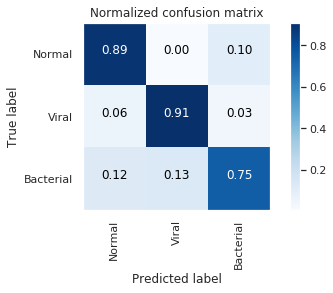

Epoch 66/70
326/326 [==============================] - 239s 733ms/step - loss: 0.3148 - accuracy: 0.8698 - val_loss: 0.9254 - val_accuracy: 0.8702

Epoch 00066: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 135ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.280007


---------------------
| Balanced Accuracy  |
---------------------

    0.8372180190362007


---------------------
|      Accuracy      |
---------------------

    0.8701923076923077


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.86      0.96      0.91       234
           1       0.88      0.95      0.91       242
           2       0.87      0.61      0.72       148

    accuracy                           0.87       624
   macro avg       0.87      0.84      0.84       624
weighted avg       0.87      0.87      0.86       624

--------------------
| 

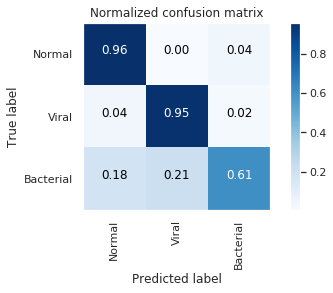

Epoch 67/70
326/326 [==============================] - 239s 733ms/step - loss: 0.2964 - accuracy: 0.8742 - val_loss: 0.7611 - val_accuracy: 0.8654

Epoch 00067: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 135ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.257863


---------------------
| Balanced Accuracy  |
---------------------

    0.8474871883962795


---------------------
|      Accuracy      |
---------------------

    0.8653846153846154


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       234
           1       0.87      0.90      0.89       242
           2       0.74      0.72      0.73       148

    accuracy                           0.87       624
   macro avg       0.85      0.85      0.85       624
weighted avg       0.87      0.87      0.87       624

--------------------
| 

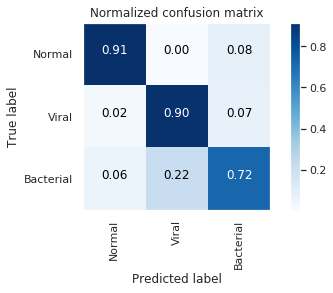

Epoch 68/70
326/326 [==============================] - 239s 733ms/step - loss: 0.2921 - accuracy: 0.8723 - val_loss: 0.6410 - val_accuracy: 0.8766

Epoch 00068: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 135ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.287334


---------------------
| Balanced Accuracy  |
---------------------

    0.8646730010366374


---------------------
|      Accuracy      |
---------------------

    0.8766025641025641


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.95      0.88      0.91       234
           1       0.88      0.93      0.90       242
           2       0.77      0.78      0.78       148

    accuracy                           0.88       624
   macro avg       0.87      0.86      0.86       624
weighted avg       0.88      0.88      0.88       624

--------------------
| 

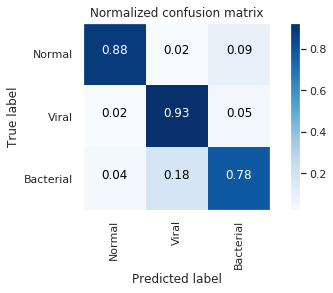

Epoch 69/70
326/326 [==============================] - 239s 733ms/step - loss: 0.2991 - accuracy: 0.8775 - val_loss: 1.0924 - val_accuracy: 0.8846

Epoch 00069: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 137ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.332698


---------------------
| Balanced Accuracy  |
---------------------

    0.8657657975839794


---------------------
|      Accuracy      |
---------------------

    0.8846153846153846


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       234
           1       0.88      0.95      0.91       242
           2       0.82      0.74      0.78       148

    accuracy                           0.88       624
   macro avg       0.88      0.87      0.87       624
weighted avg       0.88      0.88      0.88       624

--------------------
| 

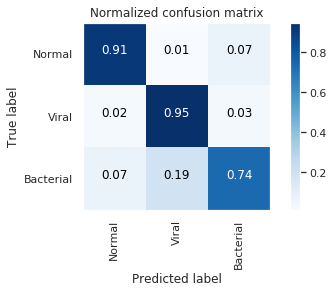

Epoch 70/70
326/326 [==============================] - 239s 733ms/step - loss: 0.2870 - accuracy: 0.8781 - val_loss: 0.9114 - val_accuracy: 0.8429

Epoch 00070: val_accuracy did not improve from 0.88622
Predicting test data
39/39 [==============================] - 5s 135ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:05.270936


---------------------
| Balanced Accuracy  |
---------------------

    0.8170659534295898


---------------------
|      Accuracy      |
---------------------

    0.842948717948718


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.83      0.94      0.88       234
           1       0.88      0.88      0.88       242
           2       0.79      0.64      0.70       148

    accuracy                           0.84       624
   macro avg       0.83      0.82      0.82       624
weighted avg       0.84      0.84      0.84       624

--------------------
| C

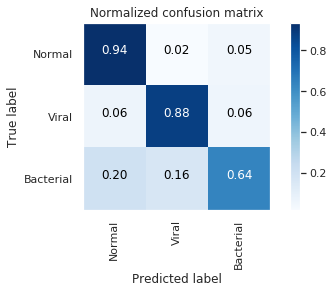

In [34]:
history = model.fit_generator(train_generator,
                              steps_per_epoch = len(train_data) // 16,
                              validation_data=val_generator,
                              validation_steps= len(test_data)// 16,
                              class_weight =class_weights,
                              epochs = 70,
                              callbacks = get_callbacks(),
                              verbose = 1
                              )

# Loading Best Model

In [35]:
from keras.models import load_model
best_model = load_model('/kaggle/working/Model/best_model_multiclass_128.h5')

# Best Model Performance

Predicting test data
39/39 [==============================] - 10s 261ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:13.055032


---------------------
| Balanced Accuracy  |
---------------------

    0.8675942312305948


---------------------
|      Accuracy      |
---------------------

    0.8862179487179487


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.97      0.88      0.92       234
           1       0.85      0.98      0.91       242
           2       0.84      0.74      0.79       148

    accuracy                           0.89       624
   macro avg       0.88      0.87      0.87       624
weighted avg       0.89      0.89      0.88       624

--------------------
| Confusion Matrix |
--------------------

 [[205   9  20]
 [  3 238   1]
 [  4  34 110]]


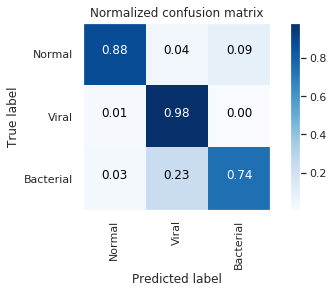

In [36]:
test_model(best_model, 
           val_generator,
           y_test = np.argmax(test_label, axis = 1),
           class_labels = ['Normal', 'Viral', 'Bacterial'])

# Plotting EpochPlot

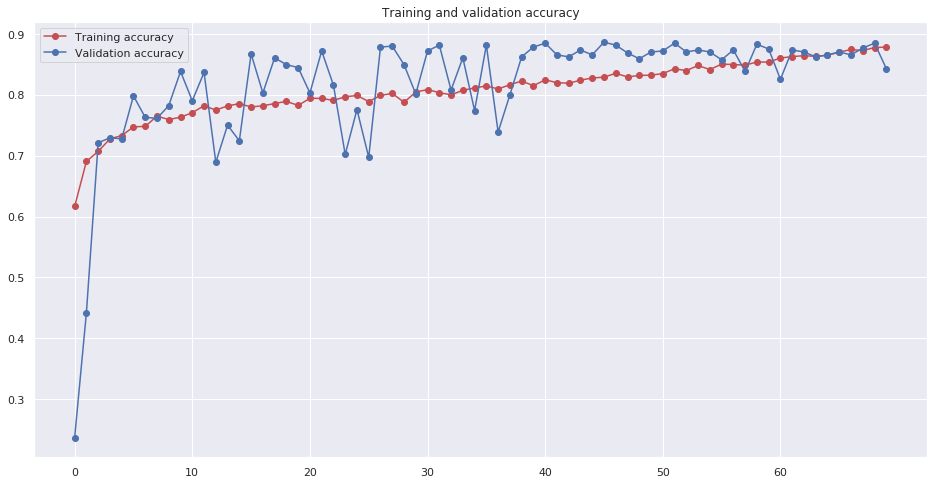

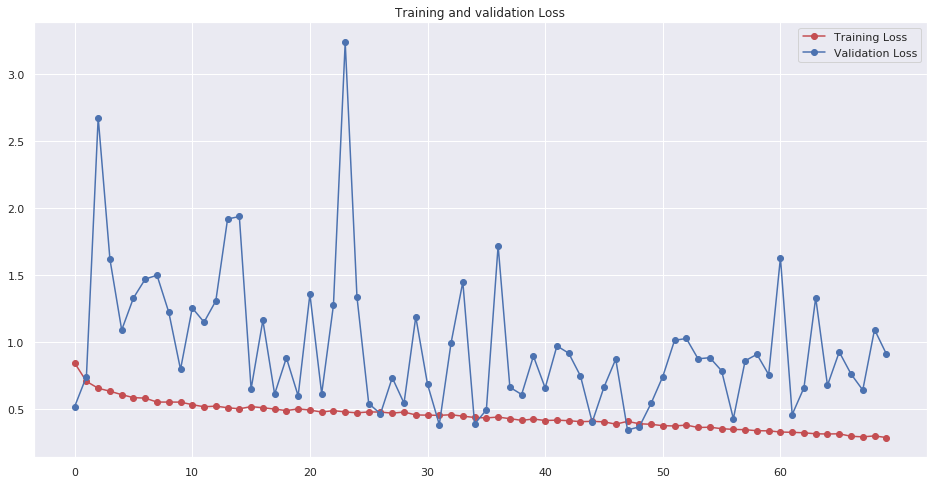

<Figure size 432x288 with 0 Axes>

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
acc = model.history.history['accuracy']
val_acc = model.history.history['val_accuracy']
loss = model.history.history['loss']
val_loss = model.history.history['val_loss']

epochs = range(0,len(acc))
fig = plt.gcf()
fig.set_size_inches(16, 8)

plt.plot(epochs, acc, 'r', label='Training accuracy',marker = "o")
plt.plot(epochs, val_acc, 'b', label='Validation accuracy',marker = "o")
plt.title('Training and validation accuracy')
plt.xticks(np.arange(0, len(acc), 10))
plt.legend(loc=0)
plt.figure()

fig = plt.gcf()
fig.set_size_inches(16, 8)
plt.plot(epochs, loss, 'r', label='Training Loss',marker = "o")
plt.plot(epochs, val_loss, 'b', label='Validation Loss',marker = "o")
plt.title('Training and validation Loss')
plt.xticks(np.arange(0, len(acc), 10))
plt.legend(loc=0)
#plt.savefig('Multiclass Model .png')
plt.figure()
plt.show()


# Grad-CAM and Saliency Map 
coming soon....